In [131]:
import os
import sys
from pathlib import Path

import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
from joblib import Parallel, delayed
from skimage import exposure, io
from skimage.util import img_as_ubyte
from tqdm.notebook import tqdm, trange
import cv2

In [132]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"
match_info_dir = data_dir / "match"

In [133]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils
import transform 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [134]:
experiment = "Lung"
core = "F7"
datasets = [
    core + "_1",
    core + "_2",
    core + "_3",
    core + "_4",
]

# Import IMC data 


In [135]:
from functools import partial

from typing import List
from skimage import measure
from skimage.transform import resize
from sklearn.neighbors import NearestNeighbors
from functools import partial
import matplotlib.patches as mpatches
from skimage.segmentation import mark_boundaries
from skimage.transform import rotate
from skimage.filters import threshold_otsu
import matplotlib.offsetbox
from matplotlib.lines import Line2D

h5_data_dir = p_dir / "data" / "h5"

class AnchoredHScaleBar(matplotlib.offsetbox.AnchoredOffsetbox):
    """ size: length of bar in data units
        extent : height of bar ends in axes units """
    def __init__(self, size=1, extent = 0.03, label="", loc=2, ax=None,
                 pad=0.4, borderpad=0.5, ppad = 0, sep=2, prop=None, 
                 frameon=True, linekw={}, textprops={}, **kwargs):
        if not ax:
            ax = plt.gca()
        trans = ax.get_xaxis_transform()
        size_bar = matplotlib.offsetbox.AuxTransformBox(trans)
        line = Line2D([0,size],[0,0], **linekw)
        vline1 = Line2D([0,0],[-extent/2.,extent/2.], **linekw)
        vline2 = Line2D([size,size],[-extent/2.,extent/2.], **linekw)
        size_bar.add_artist(line)
        size_bar.add_artist(vline1)
        size_bar.add_artist(vline2)
        txt = matplotlib.offsetbox.TextArea(label, minimumdescent=False, textprops=textprops)
        self.vpac = matplotlib.offsetbox.VPacker(children=[size_bar,txt],  
                                 align="center", pad=ppad, sep=sep) 
        matplotlib.offsetbox.AnchoredOffsetbox.__init__(self, loc, pad=pad, 
                 borderpad=borderpad, child=self.vpac, prop=prop, frameon=frameon,
                 **kwargs)

def get_imgs(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["markers"])
    return imgs, labels


def contrast_stretching(img):
    # Contrast stretching
    p2, p98 = np.percentile(img, (1, 99))
    img_rescale = exposure.rescale_intensity(
        img, in_range=(p2, p98), out_range=(0, 255)
    ).astype(np.uint8)
    return img_rescale


# Read mask image
def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def crop_img(img, info):
    # Rotate img
    y, h_region, x, w_region = info["bbox"]
    rotation = info["rotation_init"]
    rotation_small = info["rotation_adjust"]
    border = info["border"]
    
    img = rotate(img, rotation, resize=True)
    img = cv2.copyMakeBorder(
        img, border, border, border, border, cv2.BORDER_CONSTANT, None, value=0
    )
    img = contrast_stretching(img)

    # Get region for img
    if "img_region" in info.keys():
        row_min, row_max, col_min, col_max = info["img_region"]
        img = img[row_min:row_max, col_min:col_max]
        img = rotate(img, rotation_small, resize=True)
        
    if "affine" in info.keys():
        aff = info["affine"]
        pad = info["pad"]
        y = y - pad
        h_region = h_region + 2*pad
        x = x - pad
        w_region = w_region + 2*pad
        y = 0 if y < 0 else y
        x = 0 if x < 0 else x
        img_aff = img[y : y + h_region, x : x + w_region]
        img = transform.apply_global_affine(img_aff, img_aff, aff)
        y, h_region, x, w_region = info["bbox_aff"]
        
    img = img[y : y + h_region, x : x + w_region]

    return img

def plot_mutliplex(data, channels, RGB_MAP, markers, mask=None):
    img = my_utils.convert_to_rgb(data, channels=channels, vmax=255, rgb_map=RGB_MAP)
    if mask is not None:
        img = mark_boundaries(img, mask, color=(0.8, 0.8, 0.8), mode="subpixel")
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.imshow(img)
    ax.axis("off")

    # Color legend
    patches = [
        mpatches.Patch(color=RGB_MAP[i]["rgb"] / 255.0, label=markers[i - 1])
        for i in channels
    ]
    ax.legend(
        handles=patches,
        bbox_to_anchor=(0, 0),
        loc="lower right",
        borderaxespad=0.0,
        fontsize=10,
    )

    plt.show()


def get_img_subset(imgs, markers, labels):
    imgs_subset = []
    for marker in markers:
        idx = labels.index(marker)
        imgs_subset.append(imgs[idx])
    return np.stack(imgs_subset, axis=2)


def joblib_loop(task, pics):
    return Parallel(n_jobs=20)(delayed(task)(i) for i in pics)

In [136]:
imgs_imc_all = {}
masks = get_masks(data_dir / "masks", f"{experiment}_{core}")

for dataset in datasets:
    imgs, markers = get_imgs(f"{experiment} {core}", "IMC")
    imgs_imc_all[f"{experiment}_{dataset}"] = imgs

In [137]:
# import napari
# napari.view_image(imgs, channel_axis=0, name=markers, visible=False)

In [138]:
# # subset = ["Ki67", "CD68", "CD8", "CD3", "CD4"]
# subset = [["PanKeratin", "ECadherin"], ["CD4"], ["CD68"], ['COL1','SMA'], ['CD8']]
# labels = ["ECA+PanK", "CD20", "CD68", "Col1+SMA", 'CD8']

# channels = [1, 2, 3, 4, 5]
# RGB_MAP = {
#     1: {"rgb": np.array([255, 0, 255]), "range": [0, 255]},
#     2: {"rgb": np.array([0, 255, 0]), "range": [0, 255]},
#     3: {"rgb": np.array([0, 255, 255]), "range": [0, 255]},
#     4: {"rgb": np.array([255, 255, 120]), "range": [0, 255]},
#     5: {"rgb": np.array([0, 0, 255]), "range": [0, 255]},
#     6: {"rgb": np.array([160, 160, 160]), "range": [0, 255]},
# }


# for dataset in datasets:
#     try:
#         info = my_utils.load_pkl(match_info_dir / f"{experiment}_{dataset}.pickle")
#     except:
#         continue
    
#     imgs_imc = imgs_imc_all["_".join([experiment, dataset])]
#     mask = masks["_".join([experiment, dataset])]
    
#     func = partial(crop_img, info=info)
#     imgs_cropped = joblib_loop(func, imgs_imc)

#     # data = get_img_subset(imgs_cropped, subset, markers)
#     marker2img = dict(zip(markers, imgs_cropped))
#     imgs_list = []
#     for l in subset:
#         temp = []
#         for marker in l:
#             img = marker2img[marker]
#             p2, p98 = np.percentile(img, (2, 99.9))
#             img = exposure.rescale_intensity(img, in_range=(p2, p98))
#             temp.append(img)
#         imgs_list.append(np.array(np.max(temp, axis=(0))))
#     data = np.stack(imgs_list, axis=2)
#     plot_mutliplex(data, channels, RGB_MAP, labels, mask=mask)

In [139]:
# imgs, markers = get_imgs(f"{experiment} {core}", "IMC")
# subset_lung = ["HistoneH3", 'DNA2']
# subset_tonsiil = ["DNA1", "DNA2", 'Ki67', 'CD21', 'COL1', 'CD38', 'Vimentin', 'CD20', 'H3K27me3', 'PD1']

# img_dapi = np.max(contrast_stretching(imgs[[markers.index(marker) for marker in subset_lung]]), axis=0)
# img_dapi = contrast_stretching(img_dapi)

# for i, dataset in enumerate(datasets):
#     try:
#         info = my_utils.load_pkl(match_info_dir / f"{experiment}_{dataset}.pickle")
#     except:
#         continue
        
#     if i == 0:
#         rotation = info["rotation_init"]
#         try:
#             border = info['border']
#             img_dapi = cv2.copyMakeBorder(img_dapi, border, border, border, border, cv2.BORDER_CONSTANT, None, value = 0)
#         except: pass
#         img_dapi = rotate(img_dapi, rotation, resize=True)
#         fig, ax = plt.subplots(figsize=(10, 10))
#         ax.imshow(img_dapi, cmap=plt.cm.gray)
#         ax.set_axis_off()
    
#     # highlight matched region
#     y, h_region, x, w_region = info["bbox"]
#     rect = plt.Rectangle(
#         (x, y), w_region, h_region, edgecolor="r", facecolor="none", lw=3
#     )
#     ax.add_patch(rect)
#     ax.annotate(i, (x+w_region/2, y+h_region/2), color='red', weight='bold', 
#                 fontsize=30, ha='center', va='center')


# Show all markers

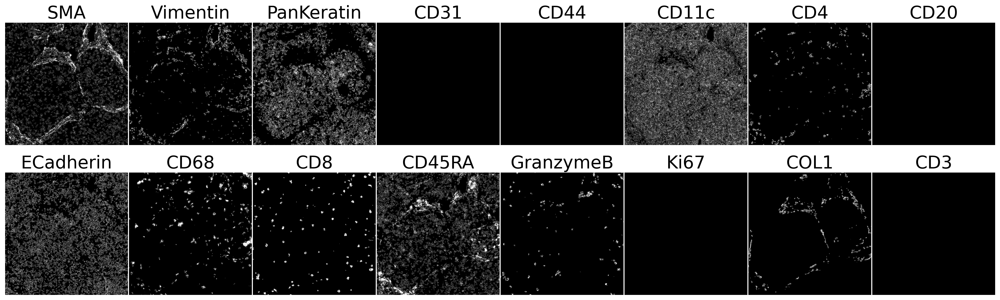

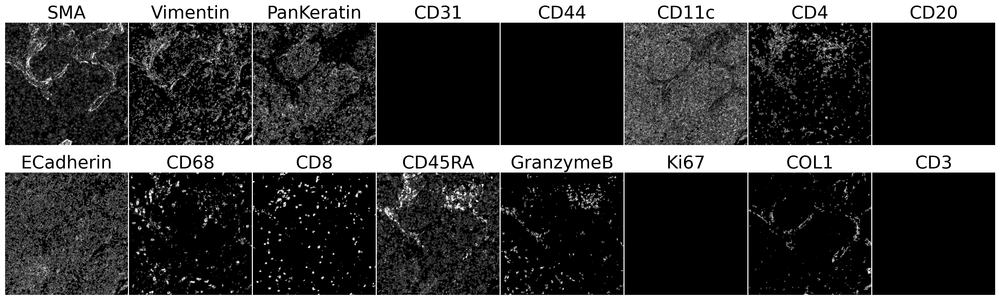

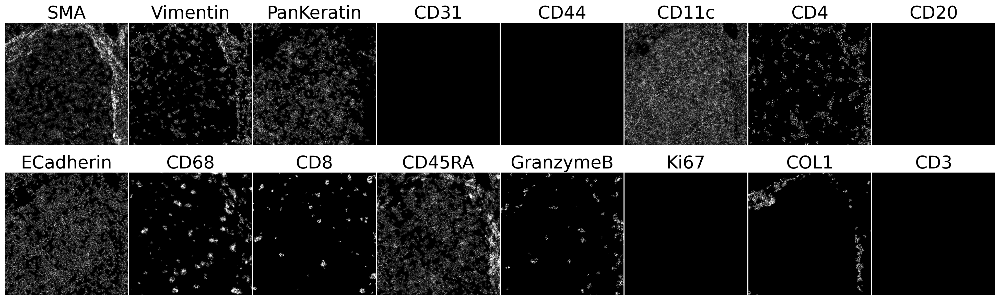

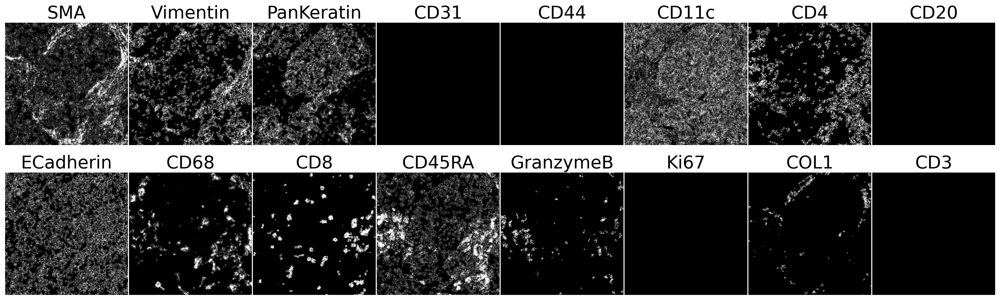

In [140]:
marker_list = ['SMA', 'Vimentin', 'PanKeratin', 'CD31', 'CD44', 'CD11c', 'CD4', 'CD20', 
               'ECadherin', 'CD68', 'CD8', 'CD45RA', 'GranzymeB', 'Ki67', 'COL1', 
               'CD3', 'HistoneH3', 'CD45RO', 
               ]
for dataset in datasets:
    try:
        info = my_utils.load_pkl(match_info_dir / f"{experiment}_{dataset}.pickle")
    except:
        continue

    mask = masks["_".join([experiment, dataset])]
    imgs_imc = imgs_imc_all["_".join([experiment, dataset])]

    func = partial(crop_img, info=info)
    imgs_cropped = joblib_loop(func, imgs_imc)

    data = get_img_subset(imgs_cropped, marker_list, markers)
    
    with plt.rc_context({'figure.dpi':200}):
        fig, ax = plt.subplots(2, 8, figsize=(25,7))
        ax = ax.flatten()
        for i, ax in enumerate(ax):
            try:
                ax.imshow(data[...,i], cmap='gray', interpolation=None)
                ax.set_title(f'{marker_list[i]}', fontsize=25)
            except:
                pass
            ax.axis('off')
        fig.subplots_adjust(wspace=0.01)
        fig.savefig(f"{experiment}_{dataset}.png")
        plt.show()
    

In [14]:
import napari 

viewer = napari.view_image(np.stack(imgs_cropped), channel_axis=0, name=markers, visible=False)
viewer.add_labels(mask)

<Labels layer 'mask' at 0x1bca3c89850>

In [15]:
viewer = napari.view_image(np.stack(imgs_imc), channel_axis=0, name=markers, visible=False)


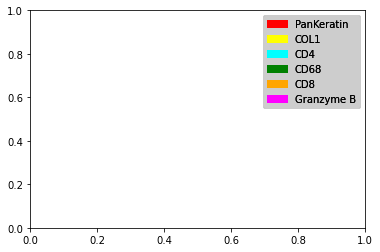

In [23]:
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches

fig, ax = plt.subplots()

patch1 = mpatches.Patch(color='red', label='PanKeratin')
patch2 = mpatches.Patch(color='yellow', label='COL1')
patch3 = mpatches.Patch(color='cyan', label='CD4')
patch4 = mpatches.Patch(color='green', label='CD68')
patch5 = mpatches.Patch(color='orange', label='CD8')
patch6 = mpatches.Patch(color='magenta', label='Granzyme B')

all_handles = (patch1, patch2, patch3, patch4, patch5, patch6)

legend = ax.legend(handles=all_handles)
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((0, 0, 0, 0.1))
ax.add_artist(legend)

plt.show()

# Show Tof-SIMS 

In [12]:
from typing import List

from skimage import measure
from skimage.transform import resize
from sklearn.neighbors import NearestNeighbors


def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs, labels


def get_imgs_index(imgs, index_list, fov_dim):

    imgs_subset = imgs[index_list, :, :]
    img_combined = np.sum(imgs_subset, axis=0)
    img_downscale = resize(img_combined, (fov_dim, fov_dim), anti_aliasing=False)
    return img_downscale

def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

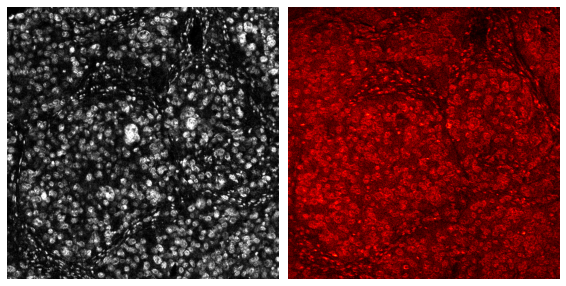

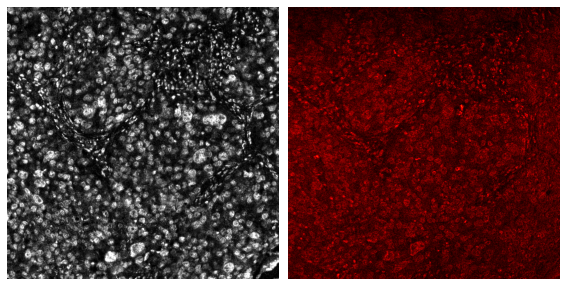

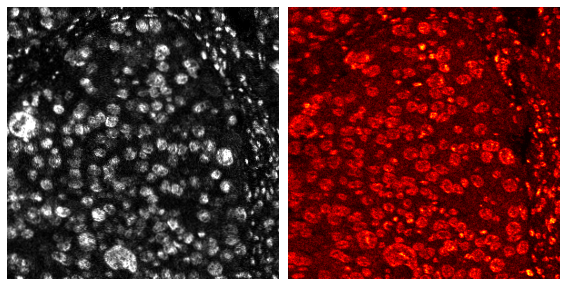

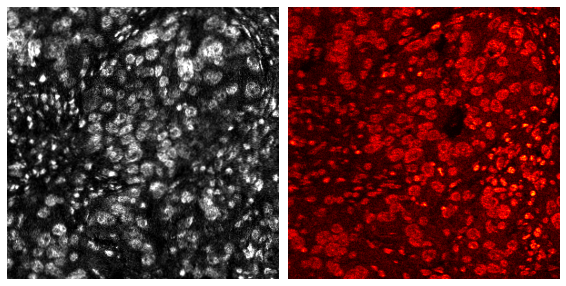

In [13]:
subset = ["HistoneH3"]

for i, dataset in enumerate(datasets):
    try:
        info = my_utils.load_pkl(match_info_dir / f"{experiment}_{dataset}.pickle")
    except:
        continue

    # ---- Load IMC image
    img_dapi = np.sum(imgs_imc[[markers.index(marker) for marker in subset]], axis=0)
    img_dapi = contrast_stretching(img_dapi)
    img = crop_img(img_dapi, info)

    # ---- Load SIMS images
    imgs, labels = get_imgs_sims(experiment, dataset)
    # Read nulcie channel
    img_nuclei_downscale = get_imgs_index(imgs, [18, 32], fov_dim=img_dapi.shape[0])
    # Contrast streching
    p2, p98 = np.percentile(img_nuclei_downscale, (1, 100))
    img_nuclei_downscale = exposure.rescale_intensity(
        img_nuclei_downscale, in_range=(p2, p98), out_range=(0, 255)
    )
    img_nuclei_downscale = img_nuclei_downscale.astype(np.uint8)

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(img, cmap="gray")
    ax[1].imshow(img_nuclei_downscale, cmap="hot")
    ax[0].axis("off")
    ax[1].axis("off")
    fig.subplots_adjust(wspace=0.01)
    plt.show()

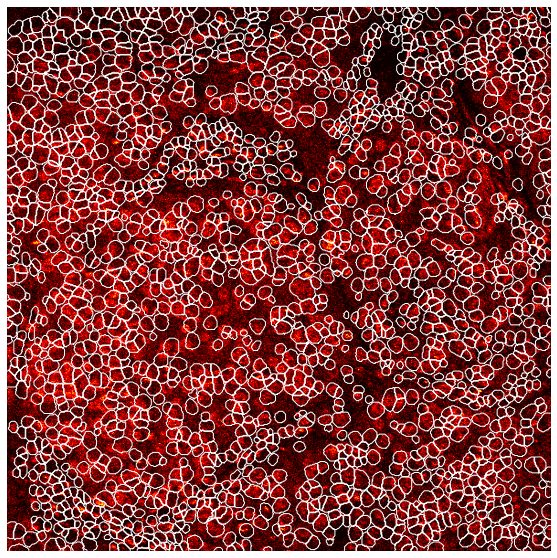

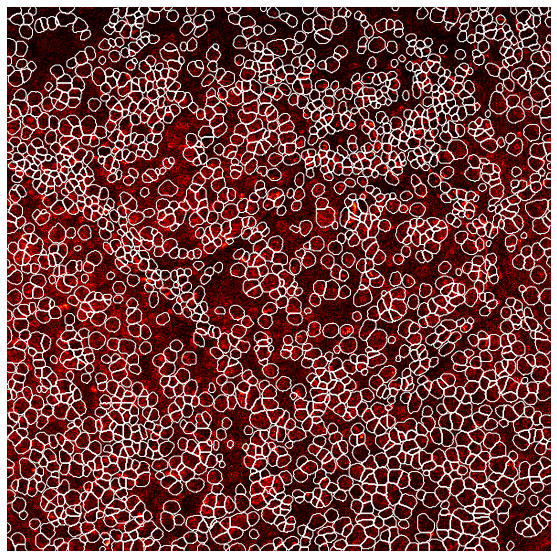

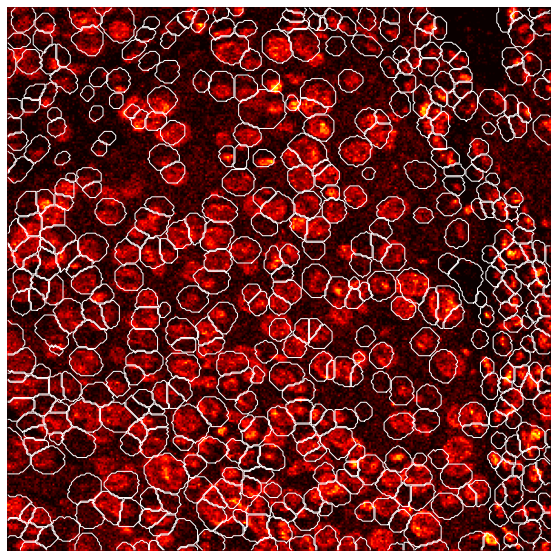

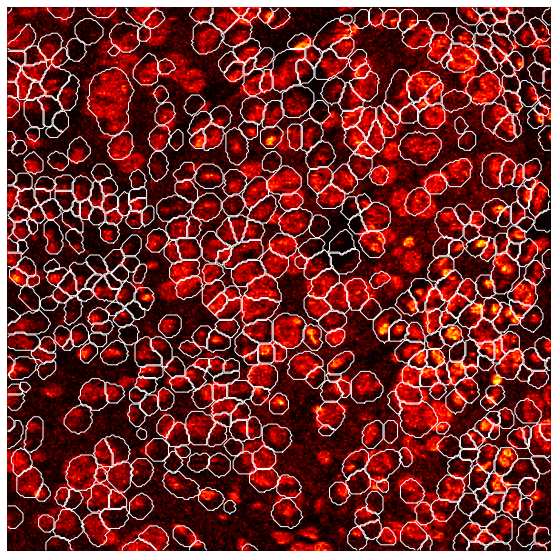

In [14]:
for i, dataset in enumerate(datasets):
    try:
        info = my_utils.load_pkl(match_info_dir / f"{experiment}_{dataset}.pickle")
    except:
        continue

    # ---- Get mask and contour
    mask = masks["_".join([experiment, dataset])]
    contours = get_contour(mask)

    # ---- Load IMC image
    img_dapi = np.sum(imgs_imc[[markers.index(marker) for marker in subset]], axis=0)
    img_dapi = contrast_stretching(img_dapi)
    img = crop_img(img_dapi, info)

    # ---- Load SIMS images
    imgs, labels = get_imgs_sims(experiment, dataset)
    # Read nulcie channel
    img_nuclei_downscale = get_imgs_index(imgs, [18, 32], fov_dim=img.shape[0])
    # Contrast streching
    p2, p98 = np.percentile(img_nuclei_downscale, (10, 100))
    img_nuclei_downscale = exposure.rescale_intensity(
        img_nuclei_downscale, in_range=(p2, p98), out_range=(0, 255)
    )
    img_nuclei_downscale = img_nuclei_downscale.astype(np.uint8)

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_nuclei_downscale, cmap="hot")
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, color="white")
    ax.axis("off")
    plt.show()

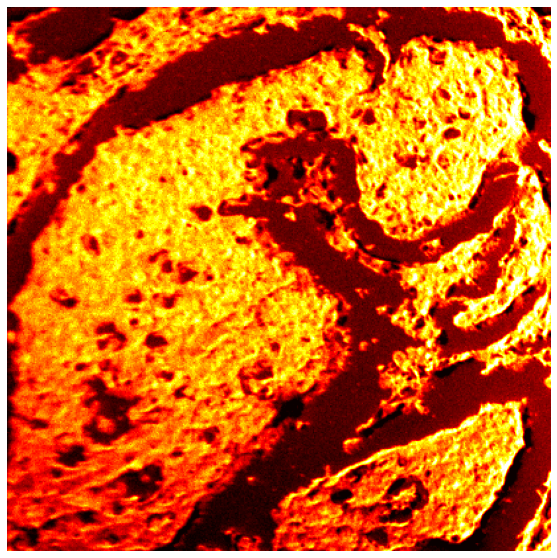

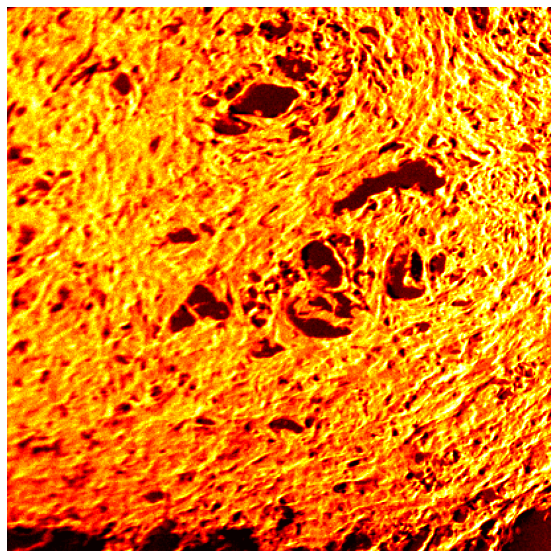

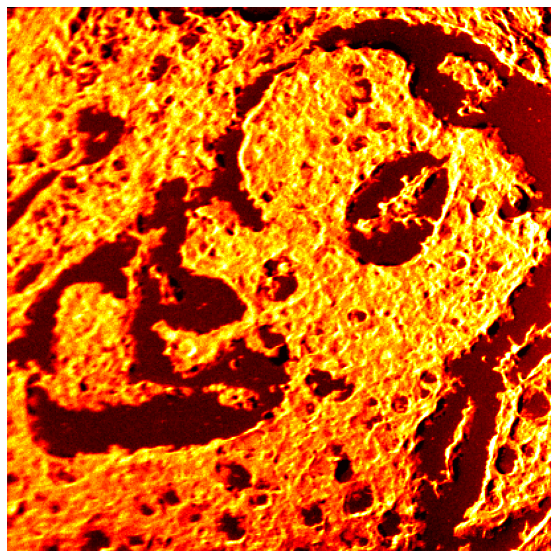

In [240]:
for i, dataset in enumerate(datasets):
    try:
        info = my_utils.load_pkl(match_info_dir / f"{experiment}_{dataset}.pickle")
    except:
        continue

    # ---- Load SIMS images
    imgs, labels = get_imgs_sims(experiment, dataset)
    # Read nulcie channel
    img_nuclei_downscale = get_imgs_index(imgs, [0, 1], fov_dim=img.shape[0])
    # Contrast streching
    p2, p98 = np.percentile(img_nuclei_downscale, (1, 99))
    img_nuclei_downscale = exposure.rescale_intensity(
        img_nuclei_downscale, in_range=(p2, p98), out_range=(0, 255)
    )
    img_nuclei_downscale = img_nuclei_downscale.astype(np.uint8)

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img_nuclei_downscale, cmap="hot")
    ax.axis("off")
    plt.show()